## In this notebook:
* Analysis of the dataset of Camelina WT and transgenic lines expressing LIP36 gene. 
* The dataset is gene expression values from developing seeds (14 days after flowering). The expression levels are in "Transcript per milion TPM". 
* Data wrangling
* Data filtering
* Exploratory data analysis
* Differential expression analysis
* Correlation analysis


## Data wrangling


In [38]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
 
%matplotlib inline
 
print("Current working directory" , os.getcwd()) # print out current working directory

Current working directory /Users/hesham_biotech/Desktop/Research_work/Courses/Python_for_Data_Science/Final_project


In [39]:
cd /Users/hesham_biotech/Desktop/Research_work/Courses/Python_for_Data_Science/Final_project

/Users/hesham_biotech/Desktop/Research_work/Courses/Python_for_Data_Science/Final_project


In [40]:
pwd

'/Users/hesham_biotech/Desktop/Research_work/Courses/Python_for_Data_Science/Final_project'

### Read in data and print header

In [54]:
filename = 'GEdata.csv' # assign dataset to filename object
CsDEG = pd.read_csv(filename, sep = ',') # read in csv file as pandas dataframe

In [55]:
CsDEG = CsDEG.set_index('Sample')

In [56]:
CsDEG.head(100)

,WT-14-B1,WT-14-B2,WT-14-B3,OCP48-14-B1,OCP48-14-B2,OCP48-14-B3
Sample,,,,,,
Csa00382s010_1,1506,1274,540,838,883,892
Csa00382s010_2,29,60,29,27,44,41
Csa00382s020_1,1527,1251,763,1280,1476,1149
Csa00382s020_2,0,0,1,0,0,0
Csa00382s030_1,0,0,0,0,0,0
...,...,...,...,...,...,...
Csa00427s100_2,1,2,1,0,0,2
Csa00427s110_1,13,28,1,13,12,13
Csa00427s110_2,1,1,0,3,1,0


In [57]:
CsDEG.shape

(178836, 6)

In [58]:
CsDEG = CsDEG.filter(like ='_1', axis =0)

In [59]:
CsDEG.head()

,WT-14-B1,WT-14-B2,WT-14-B3,OCP48-14-B1,OCP48-14-B2,OCP48-14-B3
Sample,,,,,,
Csa00382s010_1,1506,1274,540,838,883,892
Csa00382s020_1,1527,1251,763,1280,1476,1149
Csa00382s030_1,0,0,0,0,0,0
Csa00382s040_1,7,2,5,9,5,8
Csa00382s050_1,0,0,0,1,0,0


In [28]:
# select rows containing '_1'
#CsDEG = CsDEG.filter(like='_1', axis=0)

In [60]:
CsDEG.shape

(89418, 6)

### Drop rows with zero values

In [61]:
df_replace = CsDEG.replace(0.0000, np.nan)
df_dropped = df_replace.dropna(axis=0, how='any')
df_dropped.shape

(61220, 6)

In [62]:
df_dropped.head()

,WT-14-B1,WT-14-B2,WT-14-B3,OCP48-14-B1,OCP48-14-B2,OCP48-14-B3
Sample,,,,,,
Csa00382s010_1,1506.0,1274.0,540.0,838.0,883.0,892.0
Csa00382s020_1,1527.0,1251.0,763.0,1280.0,1476.0,1149.0
Csa00382s040_1,7.0,2.0,5.0,9.0,5.0,8.0
Csa00382s070_1,213.0,187.0,117.0,183.0,199.0,177.0
Csa00382s080_1,61.0,38.0,21.0,32.0,40.0,26.0


In [220]:
#data = df_dropped.filter(like = '_1', axis =0)
# Creating new dataframe with only columns containing expression values for WT seeds

### Split data into two dataframes:
* The first dataframe (WT_df) contains expression values for WT seeds
* The second dataframe (LIP36_df) contains expression values for LIP36 seeds

In [73]:
WT_df = df_dropped.filter(like = 'WT', axis =1)
# Creating new dataframe with only columns containing expression values for WT seeds

In [74]:
WT_df

,WT-14-B1,WT-14-B2,WT-14-B3
Sample,,,
Csa00382s010_1,1506.0,1274.0,540.0
Csa00382s020_1,1527.0,1251.0,763.0
Csa00382s040_1,7.0,2.0,5.0
Csa00382s070_1,213.0,187.0,117.0
Csa00382s080_1,61.0,38.0,21.0
...,...,...,...
Csa34454s010_1,7.0,11.0,7.0
Csa34686s010_1,2.0,3.0,1.0
Csa34903s010_1,1.0,7.0,1.0


In [ ]:
# transform the WT_df dataframe to Log2  

In [165]:
WT_df_log2 = np.log2(WT_df)

In [166]:
WT_df_log2.head()

,WT-14-B1,WT-14-B2,WT-14-B3,mean1,variance1
Sample,,,,,
Csa00382s010_1,10.556506,10.315150,9.076816,10.112005,17.371149
Csa00382s020_1,10.576484,10.288866,9.575539,10.204979,16.606457
Csa00382s040_1,2.807355,1.000000,2.321928,2.222392,2.078003
Csa00382s070_1,7.734710,7.546894,6.870365,7.429058,10.682605
Csa00382s080_1,5.930737,5.247928,4.392317,5.321928,8.069674


ValueError: array must not contain infs or NaNs

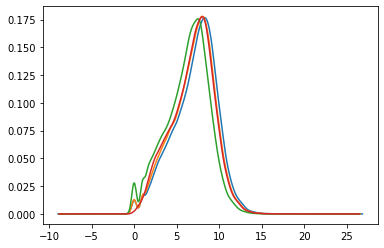

In [167]:
WT_df_log2.plot(kind='kde', legend = False) # WT seeds

* Both gene exp dataframes appear normally distributed
* This confirms that the original dataset has been normalized

In [75]:
LIP36_df = df_dropped.filter(like = 'OCP', axis =1)
# Creating new dataframe with only columns containing expression values for WT seeds

In [76]:
LIP36_df

,OCP48-14-B1,OCP48-14-B2,OCP48-14-B3
Sample,,,
Csa00382s010_1,838.0,883.0,892.0
Csa00382s020_1,1280.0,1476.0,1149.0
Csa00382s040_1,9.0,5.0,8.0
Csa00382s070_1,183.0,199.0,177.0
Csa00382s080_1,32.0,40.0,26.0
...,...,...,...
Csa34454s010_1,16.0,14.0,7.0
Csa34686s010_1,9.0,2.0,4.0
Csa34903s010_1,2.0,2.0,1.0


# transform the LIP36_df dataframe to Log2  

In [168]:
LIP36_df_log2 = np.log2(LIP36_df)

In [169]:
LIP36_df_log2.head()

,OCP48-14-B1,OCP48-14-B2,OCP48-14-B3,mean2,variance2
Sample,,,,,
Csa00382s010_1,9.710806,9.786270,9.800900,9.766529,9.124121
Csa00382s020_1,10.321928,10.527477,10.166163,10.346144,14.140208
Csa00382s040_1,3.169925,2.321928,3.000000,2.874469,1.530515
Csa00382s070_1,7.515700,7.636625,7.467606,7.541742,6.429988
Csa00382s080_1,5.000000,5.321928,4.700440,5.029747,5.039528


ValueError: array must not contain infs or NaNs

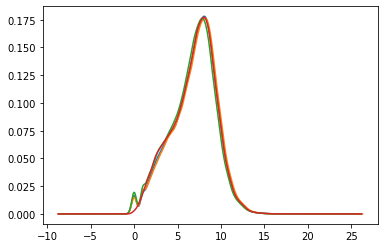

In [170]:
LIP36_df_log2.plot(kind='kde', legend = False) # LIP36 seeds

## Generate density plots to confirm the shape of the distribution


#### KDE plots of processed data separated by sample type (transgenic/WT)

<AxesSubplot:ylabel='Density'>

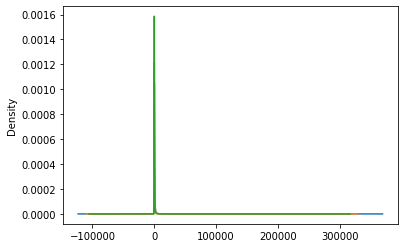

In [77]:
WT_df.plot(kind='kde', legend = False) # WT seeds

<AxesSubplot:ylabel='Density'>

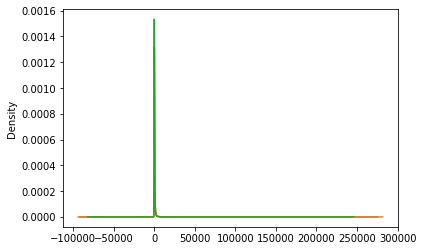

In [78]:
LIP36_df.plot(kind='kde', legend = False) # LIP36 seeds

## Add columns with row-wise mean & variance to gene exp dataframes

In [79]:
import warnings
warnings.simplefilter("ignore")
from scipy.stats import ttest_ind, ttest_ind_from_stats


WT_df['mean1'] = WT_df[WT_df.columns].mean(axis=1)
WT_df['variance1'] = WT_df[WT_df.columns].var(axis=1)
LIP36_df['mean2'] = LIP36_df[LIP36_df.columns].mean(axis=1)
LIP36_df['variance2'] = LIP36_df[LIP36_df.columns].var(axis=1)
data['mean'] = data[data.columns].mean(axis=1)
data['variance'] = data[data.columns].var(axis=1)

In [80]:
WT_df_stats = WT_df[['mean1', 'variance1']]
WT_df_stats.head()

,mean1,variance1
Sample,,
Csa00382s010_1,1106.666667,169526.222222
Csa00382s020_1,1180.333333,99779.555556
Csa00382s040_1,4.666667,4.222222
Csa00382s070_1,172.333333,1643.555556
Csa00382s080_1,40.000000,268.666667


In [81]:
LIP36_df_stats = LIP36_df[['mean2', 'variance2']]
LIP36_df_stats.head()

,mean2,variance2
Sample,,
Csa00382s010_1,871.000000,558.000000
Csa00382s020_1,1301.666667,18056.222222
Csa00382s040_1,7.333333,2.888889
Csa00382s070_1,186.333333,86.222222
Csa00382s080_1,32.666667,32.888889


### Concatenate mean/variance columns of gene exp dataframes


In [82]:
df = pd.concat([WT_df_stats, LIP36_df_stats], axis=1)

### Visualize the new dataframe to confirm proper formatting


In [83]:
df.head()

,mean1,variance1,mean2,variance2
Sample,,,,
Csa00382s010_1,1106.666667,169526.222222,871.000000,558.000000
Csa00382s020_1,1180.333333,99779.555556,1301.666667,18056.222222
Csa00382s040_1,4.666667,4.222222,7.333333,2.888889
Csa00382s070_1,172.333333,1643.555556,186.333333,86.222222
Csa00382s080_1,40.000000,268.666667,32.666667,32.888889


## Generate scatter plots: 
* Confirm that biological differences exist between the two gene expression dataframes
* In the first scatter plot, we plot the mean vs the variance of the entire dataset
* In the second scatter plot, we plot the mean of the WT data against the mean of the LIP36 data
* In both cases, 


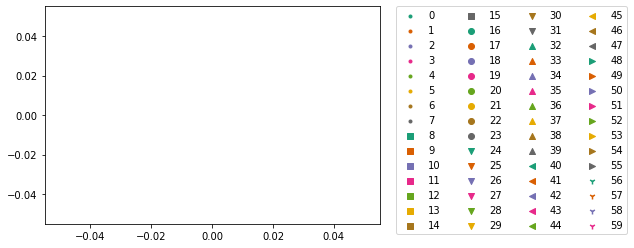

In [89]:
import itertools
import numpy as np
from matplotlib import markers
import matplotlib.pyplot as plt

m_styles = markers.MarkerStyle.markers
N = 60
colormap = plt.cm.Dark2.colors   # Qualitative colormap
for i,(marker,color) in zip(range(N),itertools.product(m_styles, colormap)):
    plt.scatter(data["mean"], data["variance"], color=color,marker=marker,label=i)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,ncol=4);

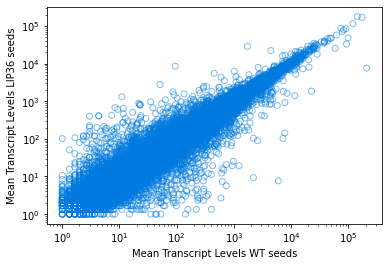

In [90]:
import copy
import matplotlib.pyplot as plt
my_figure = plt.figure()
plt.loglog() # log-scaling makes it easier


plot_df = copy.deepcopy(df)


# now, make a scatter plot
plt.scatter(x=plot_df["mean1"],
            y=plot_df["mean2"],
            marker=None,alpha=0.5,facecolor="none",edgecolor="#007ADF")
plt.xlabel("Mean Transcript Levels WT seeds")
plt.ylabel("Mean Transcript Levels LIP36 seeds")

plt.show()


* We can see genes with significant differences in mean expression levels
* This indicates that true biological differences exist between the LIP36 and WT gene exp dataframes

# Differential expression analysis
* Run t-test and load results in new column
* Sort results in descending order
* Print top 25 differentially expressed genes

In [91]:
df['ttest'] = abs((df['mean1'] - df['mean2'])/(np.sqrt(df['variance1']/3 + df['variance2']/3)))

In [92]:
diffexp_results = df['ttest']
diffexp = diffexp_results.sort_values(ascending=False)
diffexp.shape

(61220,)

## The top 25 differentially expressed genes:


In [93]:
results = diffexp.iloc[1:25]


In [94]:
results.head(25)

Sample
Csa02g002370_1          inf
Csa04g057840_1    94.208280
Csa03g058410_1    62.105074
Csa09g042880_1    54.008928
Csa20g079450_1    46.243754
Csa08g062550_1    42.668541
Csa04g043970_1    38.406966
Csa09g005380_1    37.319225
Csa20g052950_1    36.818826
Csa07g030300_1    36.233737
Csa19g040760_1    35.196143
Csa17g050280_1    34.639097
Csa11g015040_1    33.824945
Csa13g025940_1    33.678257
Csa03g019280_1    33.411076
Csa11g073680_1    31.983932
Csa07g059760_1    31.625662
Csa02g012920_1    31.548288
Csa09g034110_1    30.730714
Csa11g074500_1    30.618622
Csa03g001020_1    30.424497
Csa15g019640_1    28.762633
Csa15g020930_1    28.354625
Csa06g009080_1    28.117133
Name: ttest, dtype: float64

## Correlation analysis
* Transpose dataframes so gene names are column names
* Perform correlation analysis using corr()

In [95]:
WT_df_t = WT_df.T
correlations1 = WT_df_t.corr()
correlations1.head()

Sample,Csa00382s010_1,Csa00382s020_1,Csa00382s040_1,Csa00382s070_1,Csa00382s080_1,Csa00382s090_1,Csa00382s100_1,Csa00382s110_1,Csa00382s120_1,Csa00382s140_1,...,Csa32422s010_1,Csa32496s010_1,Csa33272s010_1,Csa33276s010_1,Csa34094s010_1,Csa34454s010_1,Csa34686s010_1,Csa34903s010_1,Csa36836s010_1,Csa37955s010_1
Sample,,,,,,,,,,,,,,,,,,,,,
Csa00382s010_1,1.000000,0.999999,-0.110453,0.998820,0.991097,-0.979814,1.000000,0.997641,0.998611,0.826568,...,-0.388933,-0.847058,0.003247,0.993972,-0.856060,-0.793692,-0.642017,0.675197,0.818282,0.985098
Csa00382s020_1,0.999999,1.000000,-0.109478,0.998889,0.991311,-0.979730,0.999998,0.997751,0.998695,0.827455,...,-0.387488,-0.847889,0.004814,0.994119,-0.855443,-0.793916,-0.641655,0.674912,0.818423,0.985162
Csa00382s040_1,-0.110453,-0.109478,1.000000,-0.102935,-0.045038,0.292223,-0.109811,-0.075796,-0.086312,0.114624,...,0.777656,-0.332484,0.797993,-0.104471,0.036816,-0.465592,-0.381279,-0.748389,-0.490421,-0.218066
Csa00382s070_1,0.998820,0.998889,-0.102935,1.000000,0.995990,-0.980902,0.998796,0.999566,0.999860,0.852246,...,-0.356596,-0.864324,0.037796,0.998094,-0.830835,-0.785121,-0.615028,0.683309,0.834018,0.989466
Csa00382s080_1,0.991097,0.991311,-0.045038,0.995990,1.000000,-0.967861,0.991070,0.997897,0.996732,0.893499,...,-0.273609,-0.903849,0.124558,0.998204,-0.792475,-0.794185,-0.594032,0.659036,0.832627,0.984584


In [96]:
LIP36_df_t = LIP36_df.T
correlations2 = LIP36_df_t.corr()
correlations2.head()

Sample,Csa00382s010_1,Csa00382s020_1,Csa00382s040_1,Csa00382s070_1,Csa00382s080_1,Csa00382s090_1,Csa00382s100_1,Csa00382s110_1,Csa00382s120_1,Csa00382s140_1,...,Csa32422s010_1,Csa32496s010_1,Csa33272s010_1,Csa33276s010_1,Csa34094s010_1,Csa34454s010_1,Csa34686s010_1,Csa34903s010_1,Csa36836s010_1,Csa37955s010_1
Sample,,,,,,,,,,,,,,,,,,,,,
Csa00382s010_1,1.000000,-0.989463,0.745876,0.976468,-0.030468,0.855405,-0.988970,-0.967336,0.982122,0.830982,...,0.908786,0.534710,0.977222,-0.971296,0.856497,-0.426788,-0.645446,0.787882,0.235683,-0.514799
Csa00382s020_1,-0.989463,1.000000,-0.810874,-0.981413,0.035522,-0.827732,0.999986,0.991337,-0.990798,-0.861569,...,-0.941678,-0.639856,-0.973017,0.946336,-0.895976,0.333253,0.535853,-0.838566,-0.290302,0.610415
Csa00382s040_1,0.745876,-0.810874,1.000000,0.699119,-0.477295,0.354245,-0.810326,-0.880555,0.739840,0.544716,...,0.954953,0.627342,0.659285,-0.767124,0.978778,-0.298219,-0.001235,0.591148,-0.013346,-0.952462
Csa00382s070_1,0.976468,-0.981413,0.699119,1.000000,0.154380,0.916156,-0.982065,-0.952081,0.998212,0.931401,...,0.862394,0.670156,0.997811,-0.897256,0.797671,-0.227213,-0.608576,0.899145,0.438843,-0.482374
Csa00382s080_1,-0.030468,0.035522,-0.477295,0.154380,1.000000,0.479812,0.031442,0.130247,0.099840,0.449453,...,-0.335009,0.313559,0.176433,0.240604,-0.430739,0.652475,-0.288018,0.422143,0.865356,0.538961


### Create dataframes with correlated values for differentially expressed genes


In [97]:
diff_exp1 = correlations1 [['Csa02g002370_1', 'Csa04g057840_1', 'Csa03g058410_1', 'Csa09g042880_1', 'Csa20g079450_1', 'Csa08g062550_1', 'Csa04g043970_1', 'Csa09g005380_1', 'Csa20g052950_1', 'Csa07g030300_1','Csa19g040760_1','Csa17g050280_1', 'Csa11g073680_1', 'Csa07g059760_1', 'Csa02g012920_1', 'Csa09g034110_1', 'Csa11g074500_1', 'Csa03g001020_1', 'Csa15g019640_1', 'Csa15g020930_1', 'Csa06g009080_1', 'Csa19g018880_1']]  

In [98]:
diff_exp2 = correlations2 [['Csa02g002370_1', 'Csa04g057840_1', 'Csa03g058410_1', 'Csa09g042880_1', 'Csa20g079450_1', 'Csa08g062550_1', 'Csa04g043970_1', 'Csa09g005380_1', 'Csa20g052950_1', 'Csa07g030300_1','Csa19g040760_1','Csa17g050280_1', 'Csa11g073680_1', 'Csa07g059760_1', 'Csa02g012920_1', 'Csa09g034110_1', 'Csa11g074500_1', 'Csa03g001020_1', 'Csa15g019640_1', 'Csa15g020930_1', 'Csa06g009080_1', 'Csa19g018880_1']]  

### Create object with only highly correlated genes

In [99]:
top_corr1 = diff_exp1[(diff_exp1 > abs(0.90)).any(1)]
top_corr1 = diff_exp1[(diff_exp1 < abs(1.0)).any(1)]

In [101]:
top_corr1.shape

(61220, 22)

In [102]:
top_corr2 = diff_exp2[(diff_exp2 > abs(0.90)).any(1)]
top_corr2 = diff_exp2[(diff_exp2 < abs(1.0)).any(1)]

In [103]:
top_corr2.shape

(61220, 22)

### Let's look at heatmaps of the top correlated cancer and normal genes

<AxesSubplot:xlabel='Sample', ylabel='Sample'>

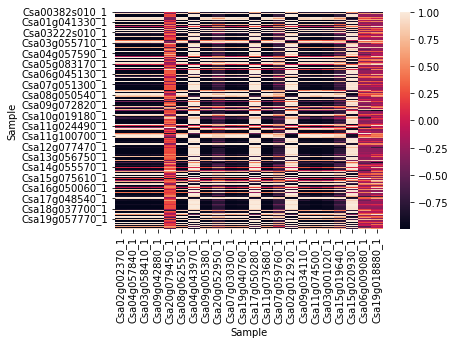

In [105]:
import seaborn as sns
sns.heatmap(top_corr2)

<AxesSubplot:xlabel='Sample', ylabel='Sample'>

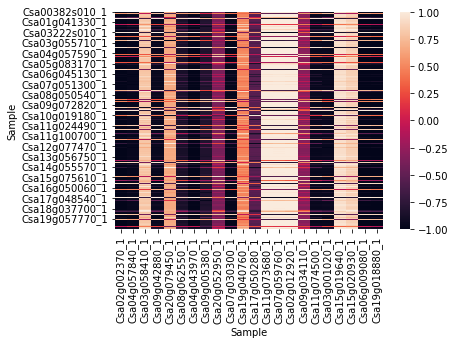

In [125]:
sns.heatmap(top_corr1)

### Let's generate pairs plots for the correlation data to further demonstrate the trends shown by the heatmaps


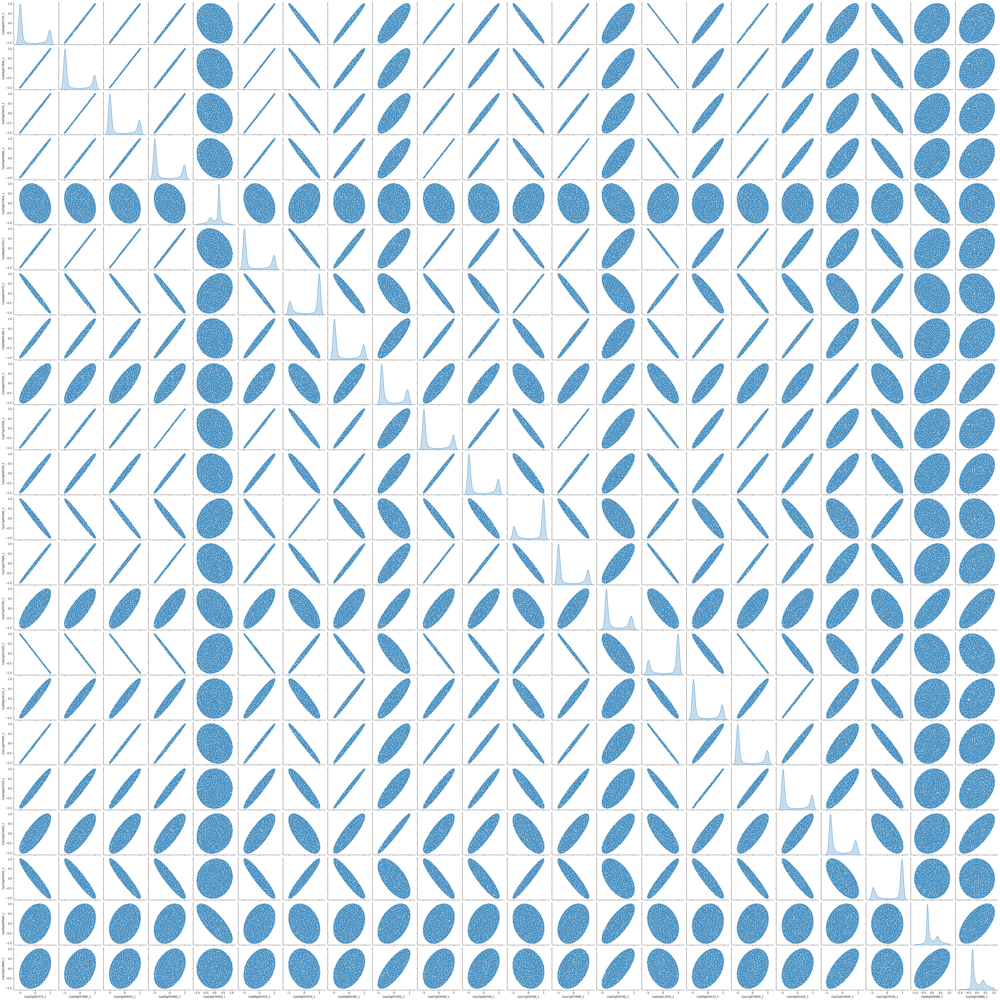

In [126]:
sns.pairplot(top_corr2, diag_kind='kde') 

## Co-Expression network using Fold-Change values

Fold Change is useful to identify genes whose expression in the two
groups of considered samples varies by a certain proportion (doubles,
halves, ...).

We define FC as follows:

$$FC = log_2 (\frac{Tumoral Expr}{Normal Expr})$$


Choosing a certain FC threshold, all the genes with absolute value of FC higher than the threshold will be differentially expressed, then they will change significantly passing from a normal condition to a tumoral one.


After this, based on the FC matrix, we compute the correlation matrix and, choosing a certain threshold, we will build an adjacency matrix: higher values will correspond to ones in our adjacency matrix, lower ones will be zeros.

So, we can obtain our directed graph.


### Concatenate mean for the two dataframes (WT and LIP36) to calculate the fold change



In [107]:
WT_df_stats = WT_df[['mean1', 'variance1']]
WT_df_stats.head()

,mean1,variance1
Sample,,
Csa00382s010_1,1106.666667,169526.222222
Csa00382s020_1,1180.333333,99779.555556
Csa00382s040_1,4.666667,4.222222
Csa00382s070_1,172.333333,1643.555556
Csa00382s080_1,40.000000,268.666667


In [108]:
LIP36_df_stats = LIP36_df[['mean2', 'variance2']]
LIP36_df_stats.head()

,mean2,variance2
Sample,,
Csa00382s010_1,871.000000,558.000000
Csa00382s020_1,1301.666667,18056.222222
Csa00382s040_1,7.333333,2.888889
Csa00382s070_1,186.333333,86.222222
Csa00382s080_1,32.666667,32.888889


In [109]:
Mean_for_FC = pd.concat([WT_df_stats, LIP36_df_stats], axis=1)

In [110]:
Mean_for_FC.head()

,mean1,variance1,mean2,variance2
Sample,,,,
Csa00382s010_1,1106.666667,169526.222222,871.000000,558.000000
Csa00382s020_1,1180.333333,99779.555556,1301.666667,18056.222222
Csa00382s040_1,4.666667,4.222222,7.333333,2.888889
Csa00382s070_1,172.333333,1643.555556,186.333333,86.222222
Csa00382s080_1,40.000000,268.666667,32.666667,32.888889


In [113]:
Mean_for_FC1 = Mean_for_FC.copy()

In [114]:
Mean_for_FC1

,mean1,variance1,mean2,variance2
Sample,,,,
Csa00382s010_1,1106.666667,169526.222222,871.000000,558.000000
Csa00382s020_1,1180.333333,99779.555556,1301.666667,18056.222222
Csa00382s040_1,4.666667,4.222222,7.333333,2.888889
Csa00382s070_1,172.333333,1643.555556,186.333333,86.222222
Csa00382s080_1,40.000000,268.666667,32.666667,32.888889
...,...,...,...,...
Csa34454s010_1,8.333333,3.555556,12.333333,14.888889
Csa34686s010_1,2.000000,0.666667,5.000000,8.666667
Csa34903s010_1,3.000000,8.000000,1.666667,0.222222


In [120]:
Mean_for_FC1['FC'] = Mean_for_FC1['mean2'] / Mean_for_FC1['mean1']

In [122]:
Mean_for_FC1.head()

,mean1,variance1,mean2,variance2,FC
Sample,,,,,
Csa00382s010_1,1106.666667,169526.222222,871.000000,558.000000,0.787048
Csa00382s020_1,1180.333333,99779.555556,1301.666667,18056.222222,1.102796
Csa00382s040_1,4.666667,4.222222,7.333333,2.888889,1.571429
Csa00382s070_1,172.333333,1643.555556,186.333333,86.222222,1.081238
Csa00382s080_1,40.000000,268.666667,32.666667,32.888889,0.816667


In [123]:
# calculate log2FC
Mean_for_FC1['log2-FC'] = Mean_for_FC1['FC'].apply(np.log2)


In [124]:
Mean_for_FC1

,mean1,variance1,mean2,variance2,FC,log2-FC
Sample,,,,,,
Csa00382s010_1,1106.666667,169526.222222,871.000000,558.000000,0.787048,-0.345476
Csa00382s020_1,1180.333333,99779.555556,1301.666667,18056.222222,1.102796,0.141166
Csa00382s040_1,4.666667,4.222222,7.333333,2.888889,1.571429,0.652077
Csa00382s070_1,172.333333,1643.555556,186.333333,86.222222,1.081238,0.112684
Csa00382s080_1,40.000000,268.666667,32.666667,32.888889,0.816667,-0.292181
...,...,...,...,...,...,...
Csa34454s010_1,8.333333,3.555556,12.333333,14.888889,1.480000,0.565597
Csa34686s010_1,2.000000,0.666667,5.000000,8.666667,2.500000,1.321928
Csa34903s010_1,3.000000,8.000000,1.666667,0.222222,0.555556,-0.847997


### select genes with log2FC > 2 (up regulated) and log2FC <= -2 (down regulated)  

In [144]:
Up_regulated_genes = Mean_for_FC1[Mean_for_FC1['log2-FC'] > 2]

In [146]:
Up_regulated_genes.head()

,mean1,variance1,mean2,variance2,FC,log2-FC
Sample,,,,,,
Csa00430s140_1,331.333333,8322.888889,2433.333333,22966.222222,7.344064,2.876579
Csa00595s010_1,2.666667,2.888889,12.000000,32.666667,4.500000,2.169925
Csa00603s020_1,4.000000,0.666667,201.000000,552.666667,50.250000,5.651052
Csa00855s010_1,3.000000,0.666667,399.000000,2648.000000,133.000000,7.055282
Csa01299s010_1,2.666667,2.888889,11.000000,34.666667,4.125000,2.044394


In [147]:
Up_regulated_genes.shape

(414, 6)

### ascending sort of log2FC column and highlight the top 10 up regulated genes

In [162]:
Up_regulated_genes.sort_values(by='log2-FC', ascending=False).head(10)

,mean1,variance1,mean2,variance2,FC,log2-FC
Sample,,,,,,
Csa00855s010_1,3.000000,0.666667,399.000000,2648.000000,133.000000,7.055282
Csa09g066290_1,11.000000,0.666667,1309.666667,9709.555556,119.060606,6.895552
Csa02g005800_1,1.000000,0.000000,101.333333,189.555556,101.333333,6.662965
Csa20g006840_1,4.333333,6.888889,411.333333,1550.888889,94.923077,6.568687
Csa20g052950_1,4.333333,2.888889,405.666667,353.555556,93.615385,6.548674
Csa02g012920_1,94.333333,830.888889,8506.666667,212474.888889,90.176678,6.494682
Csa15g003390_1,8.333333,10.888889,673.333333,3360.888889,80.800000,6.336283
Csa09g005380_1,3.000000,0.666667,223.666667,104.222222,74.555556,6.220244
Csa09g034110_1,3.000000,2.000000,202.333333,124.222222,67.444444,6.075628


### decending sort of log2FC column and highlight the top 10 down regulated genes


In [156]:
Down_regulated_genes = Mean_for_FC1[Mean_for_FC1['log2-FC'] <= -2]

In [157]:
Down_regulated_genes.head()

,mean1,variance1,mean2,variance2,FC,log2-FC
Sample,,,,,,
Csa00511s010_1,21.000000,34.666667,2.000000,0.666667,0.095238,-3.392317
Csa00511s020_1,310.333333,4648.222222,36.333333,66.888889,0.117078,-3.094453
Csa00532s070_1,6.333333,22.222222,1.333333,0.222222,0.210526,-2.247928
Csa00607s020_1,229.666667,2410.888889,30.333333,4.222222,0.132075,-2.920566
Csa00711s010_1,24.333333,121.555556,2.666667,2.888889,0.109589,-3.189825


In [161]:
Down_regulated_genes.sort_values(by=['log2-FC']).head(10)


,mean1,variance1,mean2,variance2,FC,log2-FC
Sample,,,,,,
Csa10g035950_1,5953.333333,1.509090e+06,7.666667,24.888889,0.001288,-9.600883
Csa03g012470_1,405.000000,6.734000e+03,1.333333,0.222222,0.003292,-8.246741
Csa05g002410_1,2188.000000,1.692687e+05,9.333333,3.555556,0.004266,-7.873005
Csa01g041890_1,592.666667,2.460289e+04,2.666667,2.888889,0.004499,-7.796040
Csa09g004680_1,220.000000,4.468667e+03,1.333333,0.222222,0.006061,-7.366322
Csa09g076020_1,142.333333,6.935556e+02,1.000000,0.000000,0.007026,-7.153130
Csa02g001800_1,734.333333,3.951756e+04,5.666667,1.555556,0.007717,-7.017791
Csa19g014920_1,293.666667,3.036222e+03,2.333333,0.222222,0.007946,-6.975643
Csa02g030650_1,157.333333,4.264222e+03,1.333333,0.222222,0.008475,-6.882643


In [160]:
Down_regulated_genes.shape

(548, 6)

""
Sample
Csa00382s010_1
Csa00382s020_1
Csa00382s040_1
Csa00382s070_1
Csa00382s080_1
...
Csa34454s010_1
Csa34686s010_1
Csa34903s010_1


In [141]:
# saving labels genes in a list
labels = list([Mean_for_FC1.iloc[:,:-6]])

In [142]:
labels

[Empty DataFrame
 Columns: []
 Index: [Csa00382s010_1, Csa00382s020_1, Csa00382s040_1, Csa00382s070_1, Csa00382s080_1, Csa00382s090_1, Csa00382s100_1, Csa00382s110_1, Csa00382s120_1, Csa00382s140_1, Csa00382s210_1, Csa00382s220_1, Csa00382s230_1, Csa00382s240_1, Csa00382s250_1, Csa00382s270_1, Csa00382s280_1, Csa00382s300_1, Csa00395s010_1, Csa00395s020_1, Csa00395s050_1, Csa00395s060_1, Csa00395s070_1, Csa00427s020_1, Csa00427s040_1, Csa00427s050_1, Csa00427s060_1, Csa00427s070_1, Csa00427s080_1, Csa00427s100_1, Csa00427s110_1, Csa00427s120_1, Csa00427s130_1, Csa00430s010_1, Csa00430s020_1, Csa00430s030_1, Csa00430s040_1, Csa00430s060_1, Csa00430s090_1, Csa00430s100_1, Csa00430s110_1, Csa00430s130_1, Csa00430s140_1, Csa00441s010_1, Csa00441s020_1, Csa00441s030_1, Csa00441s040_1, Csa00441s050_1, Csa00441s060_1, Csa00441s070_1, Csa00441s080_1, Csa00441s090_1, Csa00441s100_1, Csa00441s110_1, Csa00441s120_1, Csa00441s130_1, Csa00441s160_1, Csa00441s170_1, Csa00441s180_1, Csa00441s200_1, C